# LoRA (Low-Rank Adaptation) Fine-tuning

In this example, we'll show how to fine-tune the base BiT model with two different datasets using LoRa.

Then, we'll load the base model and dynamically swap both LoRA adapters depending on the task we want to complete.

# Why does this matter?

A foundation model knows how to do many things, but it's not great at many tasks. We can fine-tune the model to produce specialized models that are very good at solving specific tasks:

<img src='images/slide1.png' width="800">

We'll use LoRA to fine-tune the foundation model and generate many, `specialized adapters`.

We can load these adapters together with a model to dynamically transform its capabilities:

<img src="images/slide2.png" width="800">

When loading the model, we'll take the foundation model's **original weights** and apply the **LoRA weight** changes to it to get the fine-tuned model weights:

<img src="images/slide3.png" width="800">

The beauty of LoRA is that we don't need to fine-tune the entire matrix of weights.

Instead, we can get away by fine-tuning two matrices of lower rank. These matrices, when multiplied together, will get us the weight updates we'll need to apply the foundation model to modify its capabilities:

<img src="images/slide4.png" width="800">

#### Here is how much you can save when using LoRA to fine-tune models of different sizes:

<img src="images/slide5.png" width="800">

# Setup

In [1]:
%pip install -qU transformers accelerate evaluate datasets peft torchvision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 82.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 342.1/342.1 kB 22.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 485.4/485.4 kB 33.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 77.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 766.7/766.7 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 77.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 61.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 42.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2

Libraries:

- `transformers` – A Hugging Face library for working with NLP models like BERT, GPT, etc.
- `accelerate` – Optimizes model training across multiple GPUs/TPUs, improving performance.
- `evaluate` – Provides ready-to-use metrics for assessing AI models.
- `datasets` – Enables easy downloading and processing of large datasets.
- `peft` – Allows efficient fine-tuning of large models (e.g., LoRA, Adapters).
- `torchvision` -

We are going to use a Vision Transformer (ViT) model pre-trained on ImageNet-21k (14 million images, 21,843 classes) at resolution 224x224, and fine-tuned on ImageNet 2012 (1 million images, 1,000 classes) at resolution 224x224. [Here is the model card](https://huggingface.co/google/vit-base-patch16-224).

This model has a size of 346 MB on disk.

In [2]:
model_checkpoint = "google/vit-base-patch16-224-in21k"

# Helpful Functions

In [3]:
from pathlib import Path
from peft import PeftModel


def print_model_size(model_path: str | Path):
    """
    Calculate the total size (in bytes) of all files in the given model directory.

    :param model_path: Path to the model directory (str or Path)
    """
    model_path = Path(model_path) if isinstance(model_path, str) else model_path

    if model_path.is_file():
        model_path = model_path.parent

    if not model_path.is_dir():
        raise ValueError(f"Provided path '{model_path}' is not a valid directory.")

    size = sum(f.stat().st_size for f in model_path.rglob("*") if f.is_file())

    print(f"Model size: {(size / 1e6):.2} MB")


def print_trainable_parameters(model: PeftModel, label: str):
    parameters, trainable = 0, 0

    for _, p in model.named_parameters():
        parameters += p.numel()
        trainable += p.numel() if p.requires_grad else 0

    print(
        f"{label} trainable parameters: {trainable:,}/{parameters:,} ({100 * trainable / parameters:.2f}%)"
    )


def split_dataset(dataset):
    dataset_splits = dataset.train_test_split(test_size=0.1)
    return dataset_splits.values()


def create_label_mappings(dataset):
    label2id, id2label = dict(), dict()
    for i, label in enumerate(dataset.features["label"].names):
        label2id[label] = i
        id2label[i] = label

    return label2id, id2label

# Loading and Preparing the Datasets
We'll be loading two different datasets to fine-tune the base model:

- A dataset of pictures of food.
- A dataset of pictures of cats and dogs.

In [4]:
from datasets import load_dataset

dataset_food101 = load_dataset("food101", split="train[:10000]")
dataset_cats_vs_dogs = load_dataset(
    "microsoft/cats_vs_dogs", split="train", trust_remote_code=True
)

dataset_cats_vs_dogs

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

train-00000-of-00008.parquet:   0%|          | 0.00/490M [00:00<?, ?B/s]

train-00001-of-00008.parquet:   0%|          | 0.00/464M [00:00<?, ?B/s]

train-00002-of-00008.parquet:   0%|          | 0.00/472M [00:00<?, ?B/s]

train-00003-of-00008.parquet:   0%|          | 0.00/464M [00:00<?, ?B/s]

train-00004-of-00008.parquet:   0%|          | 0.00/475M [00:00<?, ?B/s]

train-00005-of-00008.parquet:   0%|          | 0.00/470M [00:00<?, ?B/s]

train-00006-of-00008.parquet:   0%|          | 0.00/478M [00:00<?, ?B/s]

train-00007-of-00008.parquet:   0%|          | 0.00/486M [00:00<?, ?B/s]

validation-00000-of-00003.parquet:   0%|          | 0.00/423M [00:00<?, ?B/s]

validation-00001-of-00003.parquet:   0%|          | 0.00/413M [00:00<?, ?B/s]

validation-00002-of-00003.parquet:   0%|          | 0.00/426M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/75750 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/25250 [00:00<?, ? examples/s]

README.md:   0%|          | 0.00/8.16k [00:00<?, ?B/s]

train-00000-of-00002.parquet:   0%|          | 0.00/330M [00:00<?, ?B/s]

train-00001-of-00002.parquet:   0%|          | 0.00/391M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/23410 [00:00<?, ? examples/s]

Dataset({
    features: ['image', 'labels'],
    num_rows: 23410
})

We need these mappings to properly fine-tune the Vision Transformer model. You can find more information in the [PretrainedConfig](https://huggingface.co/docs/transformers/en/main_classes/configuration#transformers.PretrainedConfig) documentation, under the "Parameters for fine-tuning tasks" section.

In [5]:
dataset_cats_vs_dogs = dataset_cats_vs_dogs.rename_column("labels", "label")

dataset_food101_train, dataset_food101_test = split_dataset(dataset_food101)
dataset_cats_vs_dogs_train, dataset_cats_vs_dogs_test = split_dataset(
    dataset_cats_vs_dogs
)

In [6]:
dataset_food101_label2id, dataset_food101_id2label = create_label_mappings(
    dataset_food101
)
dataset_cats_vs_dogs_label2id, dataset_cats_vs_dogs_id2label = create_label_mappings(
    dataset_cats_vs_dogs
)

In [7]:
config = {
    "model1": {
        "train_data": dataset_food101_train,
        "test_data": dataset_food101_test,
        "label2id": dataset_food101_label2id,
        "id2label": dataset_food101_id2label,
        "epochs": 5,
        "path": "./lora-model1",
    },
    "model2": {
        "train_data": dataset_cats_vs_dogs_train,
        "test_data": dataset_cats_vs_dogs_test,
        "label2id": dataset_cats_vs_dogs_label2id,
        "id2label": dataset_cats_vs_dogs_id2label,
        "epochs": 1,
        "path": "./lora-model2",
    },
}

Let's create an image processor automatically from the [preprocessor configuration](https://huggingface.co/google/vit-base-patch16-224/blob/main/preprocessor_config.json) specified by the base model.

In [8]:
from transformers import AutoImageProcessor

image_processor = AutoImageProcessor.from_pretrained(model_checkpoint, use_fast=True)

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

In [9]:
from torchvision.transforms import (
    CenterCrop,
    Compose,
    Normalize,
    Resize,
    ToTensor,
)

preprocess_pipeline = Compose(
    [
        Resize(image_processor.size["height"]),
        CenterCrop(image_processor.size["height"]),
        ToTensor(),
        Normalize(mean=image_processor.image_mean, std=image_processor.image_std),
    ]
)


def preprocess(batch):
    batch["pixel_values"] = [
        preprocess_pipeline(image.convert("RGB")) for image in batch["image"]
    ]
    return batch


# Let's set the transform function to every train and test sets
for cfg in config.values():
    cfg["train_data"].set_transform(preprocess)
    cfg["test_data"].set_transform(preprocess)

- **Imports transformations**:  
  `CenterCrop`, `Compose`, `Normalize`, `Resize`, and `ToTensor` from `torchvision.transforms` to process images.

- **`preprocess_pipeline`**:  
  A composition of transformations applied sequentially to images:
  - `Resize` – Resizes the image to the specified height.
  - `CenterCrop` – Crops the image at the center to match the specified size.
  - `ToTensor` – Converts the image to a tensor.
  - `Normalize` – Normalizes pixel values using predefined mean and standard deviation.

- **`preprocess(batch)`**:  
  - Converts images in `batch["image"]` to RGB.
  - Applies `preprocess_pipeline` to each image.
  - Stores the processed images in `batch["pixel_values"]`.
  - Returns the updated batch.

- **Applying preprocessing to datasets**:  
  - Iterates over `config.values()`.
  - Sets `preprocess` as the transformation for both training (`train_data`) and testing (`test_data`) datasets.

# Fine-Tuning the Model

In [10]:
import numpy as np
import evaluate
import torch
from peft import LoraConfig, get_peft_model
from transformers import AutoModelForImageClassification


metric = evaluate.load("accuracy")


def data_collate(examples):
    """
    Prepare a batch of examples from a list of elements of the
    train or test datasets.
    """
    pixel_values = torch.stack([example["pixel_values"] for example in examples])
    labels = torch.tensor([example["label"] for example in examples])
    return {"pixel_values": pixel_values, "labels": labels}


def compute_metrics(eval_pred):
    """
    Compute the model's accuracy on a batch of predictions.
    """
    predictions = np.argmax(eval_pred.predictions, axis=1)
    return metric.compute(predictions=predictions, references=eval_pred.label_ids)


def get_base_model(label2id, id2label):
    """
    Create an image classification base model from
    the model checkpoint.
    """
    return AutoModelForImageClassification.from_pretrained(
        model_checkpoint,
        label2id=label2id,
        id2label=id2label,
        ignore_mismatched_sizes=True,
    )


def build_lora_model(label2id: str, id2label):
    """Build the LoRA model to fine-tune the base model."""
    model = get_base_model(label2id, id2label)
    print_trainable_parameters(model, label="Base model")

    config = LoraConfig(
        r=16,
        lora_alpha=16,
        target_modules=["query", "value"],
        lora_dropout=0.1,
        bias="none",
        modules_to_save=["classifier"],
    )

    lora_model: PeftModel = get_peft_model(model, config)
    print_trainable_parameters(lora_model, label="LoRA")

    return lora_model

- **Imports necessary libraries**:  
  - `numpy` for numerical operations.  
  - `evaluate` for computing accuracy metrics.  
  - `torch` for tensor operations.  
  - `peft` (Parameter-Efficient Fine-Tuning) for LoRA-based model tuning.  
  - `transformers` for loading pre-trained image classification models.  

- **`metric`**:  
  - Loads an accuracy evaluation metric using `evaluate.load("accuracy")`.  

- **`data_collate(examples)`**:  
  - Prepares a batch from dataset samples.  
  - Stacks `pixel_values` tensors and converts `labels` into a tensor.  
  - Returns a dictionary with `pixel_values` and `labels`.  

- **`compute_metrics(eval_pred)`**:  
  - Computes accuracy by taking the highest probability class (`argmax`) from predictions.  
  - Uses `metric.compute()` to calculate accuracy against reference labels.  

- **`get_base_model(label2id, id2label)`**:  
  - Loads a pre-trained image classification model using `AutoModelForImageClassification`.  
  - Maps labels using `label2id` and `id2label`.  
  - Ignores mismatched layer sizes.  

- **`build_lora_model(label2id, id2label)`**:  
  - Loads the base model using `get_base_model()`.  
  - Prints the number of trainable parameters for reference.  
  - Defines LoRA configuration:  
    - `r=16`, `lora_alpha=16` – LoRA rank and scaling factor.  
    - `target_modules=["query", "value"]` – Specifies which model layers to fine-tune.  
    - `lora_dropout=0.1` – Dropout rate.  
    - `bias="none"` – Disables bias training.  
    - `modules_to_save=["classifier"]` – Ensures classifier weights are saved.  
  - Converts the base model into a LoRA-adapted model using `get_peft_model()`.  
  - Prints trainable parameters for the LoRA model.  
  - Returns the modified LoRA model.  


## Configuration

Let's now configure the fine-tuning process.

In [11]:
from transformers import TrainingArguments

batch_size = 128
training_arguments = TrainingArguments(
    output_dir="./model-checkpoints",
    remove_unused_columns=False,
    eval_strategy="epoch",
    save_strategy="epoch",
    learning_rate=5e-3,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    gradient_accumulation_steps=4,
    fp16=True,
    logging_steps=10,
    load_best_model_at_end=True,
    metric_for_best_model="accuracy",
    label_names=["labels"],
)

- **Imports `TrainingArguments`**:  
  - From `transformers`, used to configure model training settings.  

- **Defines `batch_size`**:  
  - Set to `128`, used for both training and evaluation.  

- **`training_arguments`**:  
  - Configures training parameters for a model:  
    - `output_dir="./model-checkpoints"` – Saves model checkpoints in this directory.  
    - `remove_unused_columns=False` – Prevents automatic removal of unused dataset columns.  
    - `eval_strategy="epoch"` – Runs evaluation at the end of every epoch.  
    - `save_strategy="epoch"` – Saves model checkpoints at the end of every epoch.  
    - `learning_rate=5e-3` – Sets the learning rate to `0.005`.  
    - `per_device_train_batch_size=batch_size` – Uses `128` samples per device during training.  
    - `per_device_eval_batch_size=batch_size` – Uses `128` samples per device during evaluation.  
    - `gradient_accumulation_steps=4` – Accumulates gradients for 4 steps before updating weights.  
    - `fp16=True` – Enables mixed-precision training (reduces memory usage and speeds up training).  
    - `logging_steps=10` – Logs training progress every 10 steps.  
    - `load_best_model_at_end=True` – Loads the best model checkpoint at the end of training.  
    - `metric_for_best_model="accuracy"` – Uses accuracy to determine the best model.  
    - `label_names=["labels"]` – Specifies the name of the label field in the dataset.  


## Fine-Tune both models

In [12]:
from transformers import Trainer

for cfg in config.values():
    training_arguments.num_train_epochs = cfg["epochs"]
    training_arguments.report_to = "none"

    trainer = Trainer(
        build_lora_model(cfg["label2id"], cfg["id2label"]),
        training_arguments,
        train_dataset=cfg["train_data"],
        eval_dataset=cfg["test_data"],
        tokenizer=image_processor,
        compute_metrics=compute_metrics,
        data_collator=data_collate,
    )

    results = trainer.train()
    evaluation_results = trainer.evaluate(cfg['test_data'])
    print(f"Evaluation accuracy: {evaluation_results['eval_accuracy']}")

    # We can now save the fine-tuned model to disk.
    trainer.save_model(cfg["path"])
    print_model_size(cfg["path"])

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
<ipython-input-12-67ba5e5382f3>:7: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Base model trainable parameters: 85,876,325/85,876,325 (100.00%)
LoRA trainable parameters: 667,493/86,543,818 (0.77%)


Epoch,Training Loss,Validation Loss,Accuracy
1,2.417800,0.233696,0.944000
2,0.164300,0.146497,0.954000
3,0.085200,0.141800,0.952000
4,0.043000,0.133835,0.959000


Evaluation accuracy: 0.959
Model size: 2.7 MB


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
<ipython-input-12-67ba5e5382f3>:7: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Base model trainable parameters: 85,800,194/85,800,194 (100.00%)
LoRA trainable parameters: 591,362/86,391,556 (0.68%)


Epoch,Training Loss,Validation Loss,Accuracy
1,0.011700,0.014088,0.995301
2,0.007700,0.012179,0.996583
3,0.003500,0.016129,0.996155
4,0.003000,0.016226,0.997010


Evaluation accuracy: 0.9970098248611704
Model size: 2.4 MB


In [18]:
import torch
import gc

del trainer
gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


## Running Inference

Let's start by defining a couple of functions that will help us build the inference model and run predictions using it.

In [13]:
def build_inference_model(label2id, id2label, lora_adapter_path):
    """Build the model that will be use to run inference."""

    # Let's load the base model
    model = get_base_model(label2id, id2label)

    # Now, we can create the inference model combining the base model
    # with the fine-tuned LoRA adapter.
    return PeftModel.from_pretrained(model, lora_adapter_path)


def predict(image, model, image_processor):
    """Predict the class represented by the supplied image."""

    encoding = image_processor(image.convert("RGB"), return_tensors="pt")
    with torch.no_grad():
        outputs = model(**encoding)
        logits = outputs.logits

    class_index = logits.argmax(-1).item()
    return model.config.id2label[class_index]

We need to create two inference models, one using each of the LoRA adapters:

In [14]:
for cfg in config.values():
    cfg["inference_model"] = build_inference_model(cfg["label2id"], cfg["id2label"], cfg["path"])
    cfg["image_processor"] = AutoImageProcessor.from_pretrained(cfg["path"])

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Here is a list of sample images and the model that we need to use to

In [15]:
samples = [
    {
        "image": "https://www.allrecipes.com/thmb/AtViolcfVtInHgq_mRtv4tPZASQ=/1500x0/filters:no_upscale():max_bytes(150000):strip_icc()/ALR-187822-baked-chicken-wings-4x3-5c7b4624c8554f3da5aabb7d3a91a209.jpg",
        "model": "model1",
    },
    {
        "image": "https://wallpapers.com/images/featured/kitty-cat-pictures-nzlg8fu5sqx1m6qj.jpg",
        "model": "model2",
    },
    {
        "image": "https://i.natgeofe.com/n/5f35194b-af37-4f45-a14d-60925b280986/NationalGeographic_2731043_3x4.jpg",
        "model": "model2",
    },
    {
        "image": "https://www.simplyrecipes.com/thmb/KE6iMblr3R2Db6oE8HdyVsFSj2A=/1500x0/filters:no_upscale():max_bytes(150000):strip_icc()/__opt__aboutcom__coeus__resources__content_migration__simply_recipes__uploads__2019__09__easy-pepperoni-pizza-lead-3-1024x682-583b275444104ef189d693a64df625da.jpg",
        "model": "model1"
    }
]

We can now run predictions on every sample.

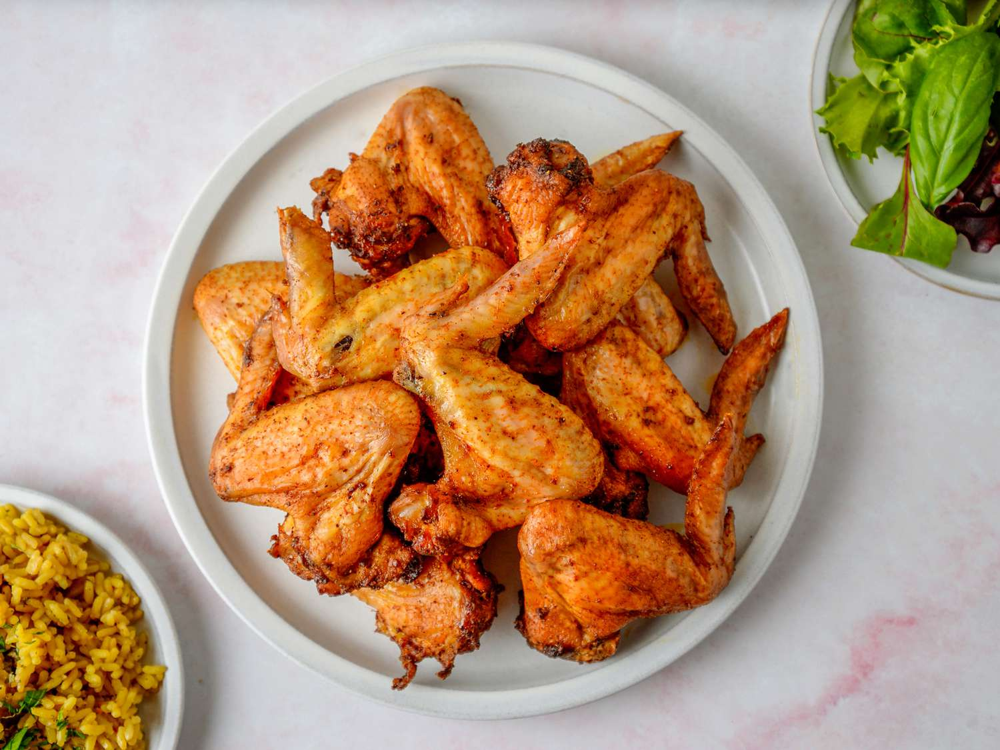

Prediction: chicken_wings


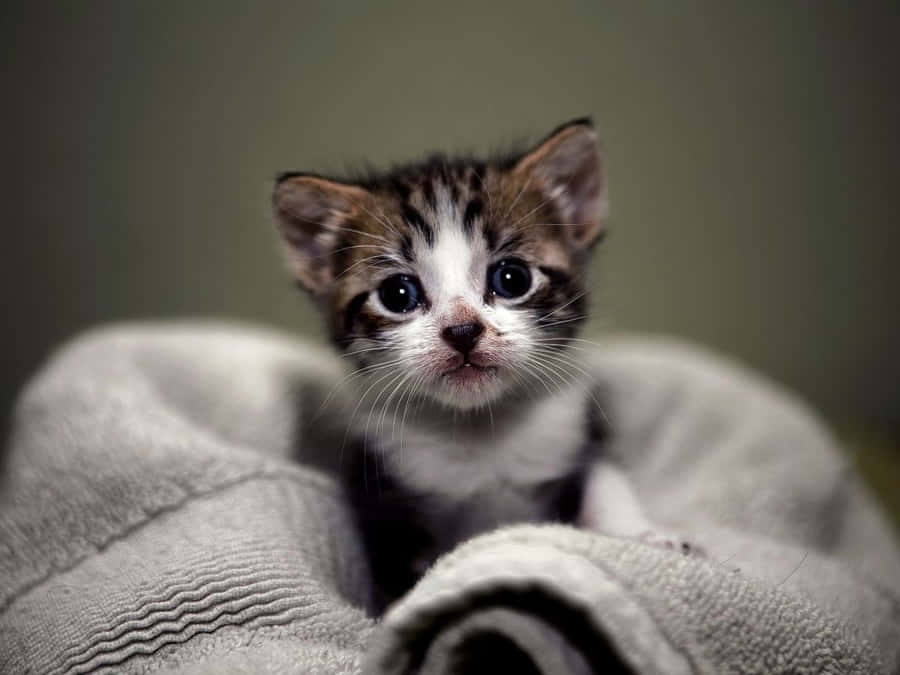

Prediction: cat


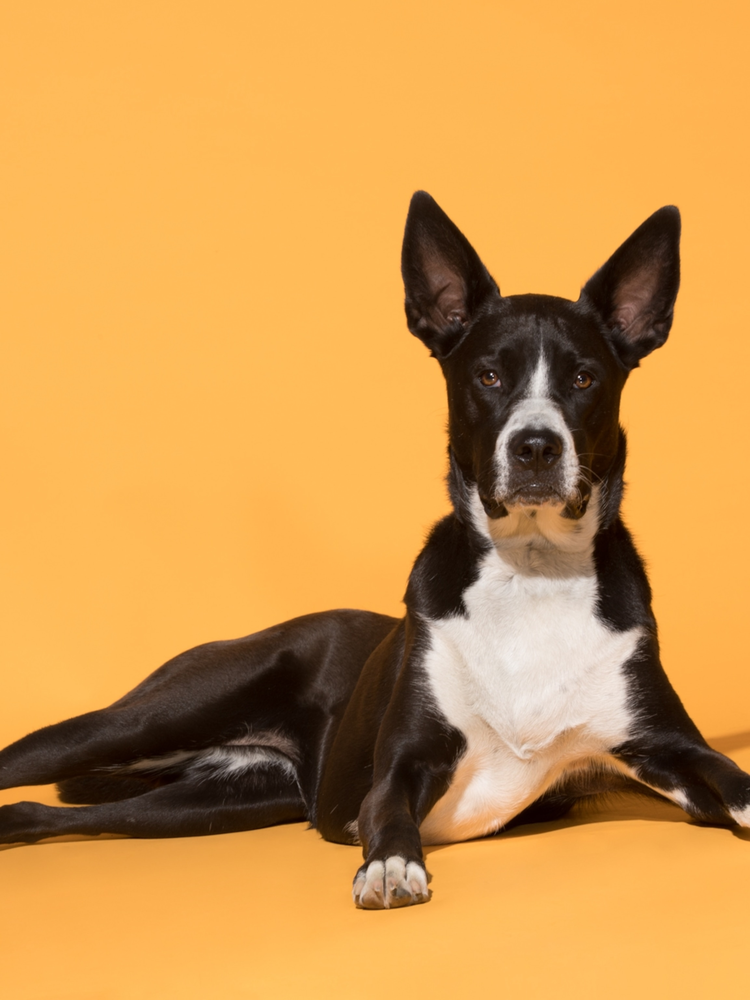

Prediction: dog


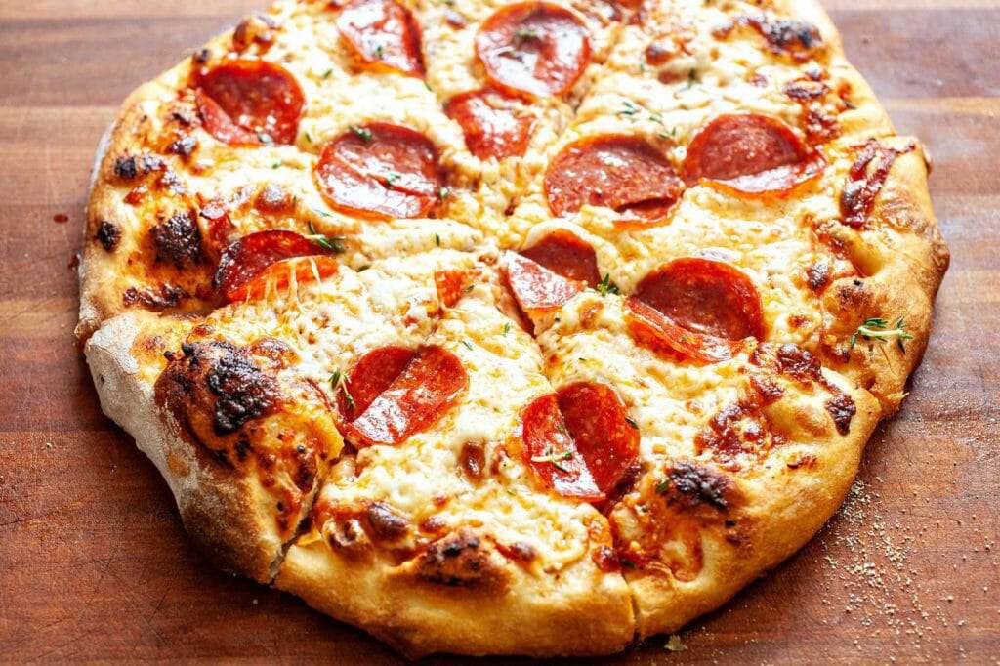

Prediction: pizza


In [16]:
from PIL import Image
import requests
from IPython.display import display

for sample in samples:
    image = Image.open(requests.get(sample["image"], stream=True).raw)

    display(image)

    inference_model = config[sample["model"]]["inference_model"]
    image_processor = config[sample["model"]]["image_processor"]

    prediction = predict(image, inference_model, image_processor)
    print(f"Prediction: {prediction}")